In [151]:
import numpy as np
import pandas as pd
import plotly.express as px
import math

pd.options.plotting.backend = "plotly"

# Mass Spring Damper Simulation

Declaring state variables
- x : position (m)
- v : velocity (m/s)
- f : force (N)
- m : mass (Kg)
- k : spring constant ($Nm^{-1}$)
- b : damping co-efficient ($Nm^{-1}s$)

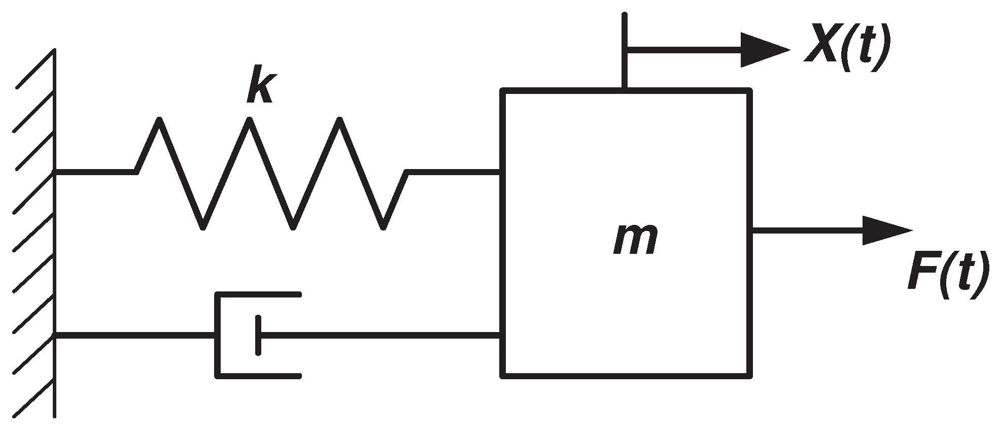

In [138]:
x = 10
v = 0
f = 0
m = 10

k = 2
b = 1

## State Space
For the mass spring damper system, we know that the state $\underline{X}$ for mass spring damper system is defined using position and velocity. Hence the initial state $\underline{X_0}$ is defined as a 2x1 vector. 

In [139]:
X_0 = np.array(
    [
        [x],
        [v]
    ]
)

Now the system dynamics can be defined as a ODE using matrices:  
$\underline{\dot{X}} = A\underline{X} + Bf$

In [140]:
A = np.array(
    [
        [0, 1],
        [-k / m, -b / m]
    ]
)

B = np.array(
    [
        [0],
        [1 / m]
    ]
)

def dx(X, t = None):
    return A@X + B*f

In [141]:
# testing on initial condition
assert np.array_equal(
    dx(X_0, 0), 
    np.array(
        [
            [0.], 
            [-2.]
        ]
    )
)

In [142]:
# utils
def plot_state_vs_time(df):    
    fig = df.plot()
    fig.update_layout(height=700)
    fig.show()

## Euler Numerical Integrator
$\underline{X(t_{k + 1})} = \underline{X(t_{k})} + dt\underline{\dot{X(t_{k})}}$

In [143]:
def euler_step(X_k):
    X_k_1 = X_k + dt*dx(X_k)
    return X_k_1

def euler_integrator(x_0, t_0, t_n, dt, dx):
    x = x_0
    t = t_0
    
    yield (x, t)
    
    while t <= t_n:
        # eval x_k+1 using x_k and t_k
        x = x + dt * dx(x, t)
        
        # t increament to t_k+1
        t = t + dt
        
        yield (x, t)

## Runga Kutta 4 Numerical Integrator

https://en.wikipedia.org/wiki/Runge%E2%80%93Kutta_methods

$\underline{X(t_{k + 1})} = \underline{X(t_{k})} + dt(k_1 + 2k_2 + 2k_3 + k_4)\frac{1}{6}$

where:  
$f(x,t) = \underline{\dot{X(t_{k})}}$  
$k_1 = f(\underline{x_k}, t_k)$  
$k_2 = f(\underline{x_k} + dt\frac{k_1}{2}, t_k + \frac{dt}{2})$  
$k_3 = f(\underline{x_k} + dt\frac{k_2}{2}, t_k + \frac{dt}{2})$  
$k_4 = f(\underline{x_k} + dt k_3, t_k + dt)$  

In [144]:
def rk4_integrator(x_0, t_0, t_n, dt, dx):
    x = x_0
    t = t_0
    
    yield (x, t)
    
    while t <= t_n:
        # eval x_k+1 using x_k and t_k
        k1 = dx(x, t)
        k2 = dx(x + dt * k1 / 2, t + dt / 2)
        k3 = dx(x + dt * k2 / 2, t + dt / 2)
        k4 = dx(x + dt * k3, t + dt)
        
        x = x + dt * (k1 + 2*k2 + 2*k3 + k4) * (1/6)
        
        # t increament to t_k+1
        t = t + dt
        
        yield (x, t)

## Using the integrators on the system

In [145]:
# Integrate over t
T = 60 # time (seconds)

# Euler
dt = 1e-3 # delta time (seconds)
state_time = []
state_integrator = euler_integrator(X_0, 0, T, dt, dx)
for x, t in state_integrator:
    state_time.append({"Position (Euler)": x[0][0], "Velocity (Euler)": x[1][0], "Time": t})
e_state_time_df = pd.DataFrame(state_time).set_index("Time")

# RK4
dt = 1e-1 # delta time (seconds)
state_time = []
state_integrator = rk4_integrator(X_0, 0, T, dt, dx)
for x, t in state_integrator:
    state_time.append({"Position (RK4)": x[0][0], "Velocity (RK4)": x[1][0], "Time": t})
r_state_time_df = pd.DataFrame(state_time).set_index("Time")

state_time_df = pd.concat([r_state_time_df, e_state_time_df])

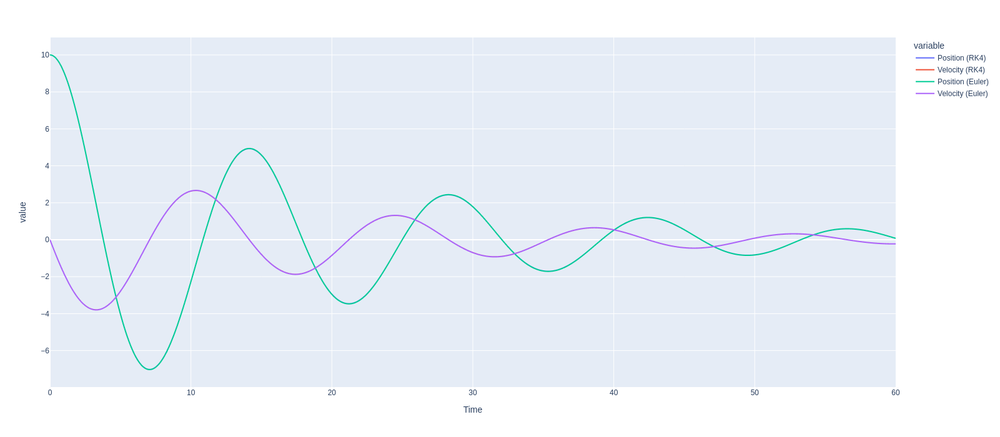

In [146]:
plot_state_vs_time(state_time_df)

# Numerical solvers vs Analytical solvers
In the following section, we will apply the numberical integrators to check their accuracy against analytical solutions

### Q1.
Analystical solution: $x$  
System Dynamics: $x$

In [147]:
def fk1(t, x):
    return (2 - math.exp(-4*t) - (2 * x))

def rk_4(x, t, dt):
    k1 = fk1(t, x)
    k2 = fk1(t + 0.5 * dt, x + dt * k1 * 0.5)
    k3 = fk1(t + 0.5 * dt, x + dt * k2 * 0.5)
    k4 = fk1(t + dt, x + dt * k3)
    x_k = x + dt * (k1 + 2 * k2 + 2 * k3 + k4) * (1/6)
    return x_k

# Integrate over t
t = 5 # time (seconds)

X_0 = 1
pos_arr = []
time_arr = []
pos_arr_a = []
pos_arr_rk = []

temp_t = 0
temp_X = X_0
temp_X_r = X_0

pos_arr.append(temp_X)
pos_arr_a.append(temp_X)
pos_arr_rk.append(temp_X_r)
time_arr.append(temp_t)

while temp_t <= t:
    temp_X = temp_X + dt * (2 - math.exp(-4*temp_t) - (2 * temp_X))
    temp_X_r = rk_4(temp_X_r, temp_t, dt)
    
    temp_t += dt # not dt increased after calc
    
    pos_arr.append(temp_X)
    pos_arr_a.append(1 + 0.5 * math.exp(-4 * temp_t) - 0.5 * math.exp(-2 * temp_t))
    pos_arr_rk.append(temp_X_r)
    time_arr.append(temp_t)

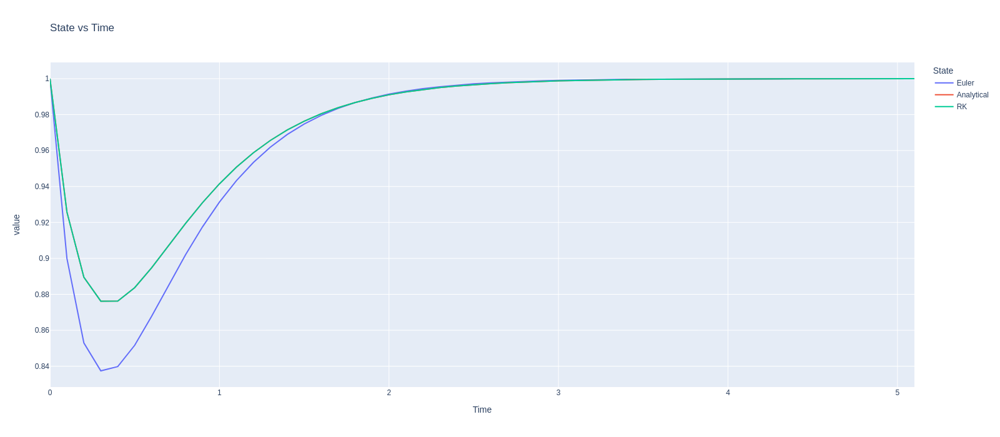

In [148]:
df = pd.DataFrame({"Euler": np.array(pos_arr), "Analytical": np.array(pos_arr_a), "RK": np.array(pos_arr_rk)}, index = np.array(time_arr))
df.index.name = "Time"
df.columns.name = "State"

fig = px.line(df, title='State vs Time')
fig.update_layout(height=700)
fig.show()

In [149]:
def d_f(t, x):
    return -0.5 * math.exp(t/2)*math.sin(5*t) + 5*math.exp(t/2)*math.cos(5*t)+x

def rk_4(x, t, dt):
    k1 = d_f(t, x)
    k2 = d_f(t + 0.5 * dt, x + dt * k1 * 0.5)
    k3 = d_f(t + 0.5 * dt, x + dt * k2 * 0.5)
    k4 = d_f(t + dt, x + dt * k3)
    x_k = x + dt * (k1 + 2 * k2 + 2 * k3 + k4) * (1/6)
    return x_k

# Integrate over t
t = 5 # time (seconds)

X_0 = 0
pos_arr = []
time_arr = []
pos_arr_a = []
pos_arr_rk = []

temp_t = 0
temp_X = X_0
temp_X_r = X_0

pos_arr.append(temp_X)
pos_arr_a.append(temp_X)
pos_arr_rk.append(temp_X_r)
time_arr.append(temp_t)

while temp_t <= t:
    temp_X = temp_X + dt * d_f(temp_t, temp_X)
    temp_X_r = rk_4(temp_X_r, temp_t, dt)
    
    temp_t += dt # not dt increased after calc
    
    pos_arr.append(temp_X)
    pos_arr_a.append(math.exp(temp_t / 2) * math.sin(5 * temp_t))
    pos_arr_rk.append(temp_X_r)
    time_arr.append(temp_t)

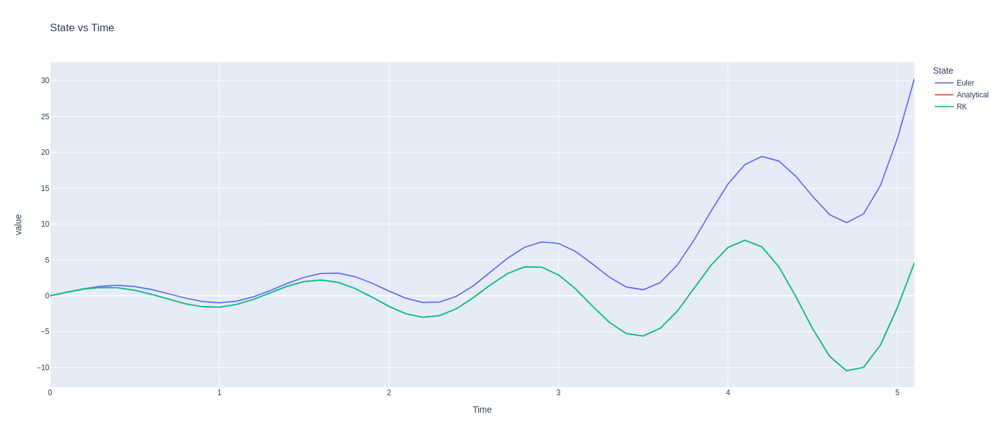

In [150]:
df = pd.DataFrame({"Euler": np.array(pos_arr), "Analytical": np.array(pos_arr_a), "RK": np.array(pos_arr_rk)}, index = np.array(time_arr))
df.index.name = "Time"
df.columns.name = "State"

fig = px.line(df, title='State vs Time')
fig.update_layout(height=700)
fig.show()

# Handling Error & Unobservable State